In [1]:
# jupyter setup boilerplate
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

from tqdm.auto import tqdm
from scipy.optimize import curve_fit

from qick import *

# for now, all the tProc v2 classes need to be individually imported (can't use qick.*)

# the main program class
from qick.asm_v2 import AveragerProgramV2
# for defining sweeps
from qick.asm_v2 import QickSweep1D

from hist_analysis import hist_process

In [2]:
# to connect to a pyro server, uncomment and run this cell, skip the next cell
from qick.pyro import make_proxy
# soc, soccfg = make_proxy(ns_host="pynq4x2.dhcp.fnal.gov", ns_port=8888, proxy_name="myqick")
soc, soccfg = make_proxy(ns_host="pynq216.dhcp.fnal.gov", ns_port=8888, proxy_name="myqick")
print(soccfg)

# use pyro's traceback code instead of ipython's (optional)
# adapted from https://pyro4.readthedocs.io/en/stable/errors.html and https://stackoverflow.com/a/70433500
import IPython
import Pyro4.util
import sys

from IPython import get_ipython
ip = get_ipython()

def exception_handler(self, etype, evalue, tb, tb_offset=None):
    sys.stderr.write("".join(Pyro4.util.getPyroTraceback()))
    # self.showtraceback((etype, evalue, tb), tb_offset=tb_offset)  # standard IPython's printout

ip.set_custom_exc((Exception,), exception_handler)  # register your handler

Pyro.NameServer PYRO:Pyro.NameServer@0.0.0.0:8888
myqick PYRO:obj_1749273860df489298535bdb7533f0d3@131.225.86.222:34185
QICK running on ZCU216, software version 0.2.272

Firmware configuration (built Fri Jul 19 13:04:20 2024):

	Global clocks (MHz): tProcessor 614.400, RF reference 245.760

	1 signal generator channels:
	0:	axis_signal_gen_v6 - envelope memory 16384 samples (1.667 us)
		fs=9830.400 MHz, fabric=614.400 MHz, 32-bit DDS, range=9830.400 MHz
		DAC tile 2, blk 0 is 0_230, on JHC3

	2 readout channels:
	0:	axis_dyn_readout_v1 - configured by tProc output 1
		fs=2457.600 MHz, decimated=307.200 MHz, 32-bit DDS, range=2457.600 MHz
		maxlen 16384 accumulated, 65536 decimated (213.333 us)
		triggered by tport 0, pin 0, feedback to tProc input 0
		ADC tile 2, blk 0 is 0_226, on JHC7
	1:	axis_readout_v2 - configured by PYNQ
		fs=2457.600 MHz, decimated=307.200 MHz, 32-bit DDS, range=2457.600 MHz
		maxlen 16384 accumulated, 65536 decimated (213.333 us)
		triggered by tport 1, pin 0, 

In [3]:
# from qick_training import *

# # soc = QickTrainingSoc(bitfile="/data/fw/2024-07-15_216_tprocv2r20_kidsim-dynROv1-2/qick_216.bit")
# soc = QickTrainingSoc(bitfile="../../fw/2024-07-18_4x2_tprocv2r20_kidsim/qick_4x2.bit")

# soccfg = soc
# print(soccfg)

In [228]:
soc.reset_attenuation()
soc.disable_resonator()

In [5]:
GEN_CH = 0
RO_CH = 0
TRIG_TIME = 3.5
# FREQ = 307.2/2

In [6]:
# class SimpleSweepProgram(AveragerProgramV2):
#     def initialize(self, cfg):
#         ro_ch = cfg['ro_ch']
#         gen_ch = cfg['gen_ch']
        
#         self.declare_gen(ch=gen_ch, nqz=1)
#         self.declare_readout(ch=ro_ch, length=cfg['ro_len'])
#         self.add_readoutconfig(ch=ro_ch, name="myro", freq=cfg['freq'], gen_ch=gen_ch)

#         self.add_pulse(ch=gen_ch, name="mypulse", ro_ch=ro_ch, 
#                        style="const", 
#                        freq=cfg['freq'], 
#                        length=cfg['pulse_len'],
#                        phase=cfg['phase'],
#                        gain=cfg['gain'], 
#                       )
#         # configure the readout
#         self.send_readoutconfig(ch=cfg['ro_ch'], name="myro", t=0)
        
#     def body(self, cfg):
#         self.pulse(ch=cfg['gen_ch'], name="mypulse", t=0)
#         self.trigger(ddr4=True, mr=True, t=cfg['trig_time']-0.5)
#         self.trigger(ros=[cfg['ro_ch']],  pins=[0], t=cfg['trig_time'])

# config = {'gen_ch': GEN_CH,
#           'ro_ch': RO_CH,
#           'freq': FREQ,
#           'trig_time': TRIG_TIME,
#           'ro_len': 1,
#           'pulse_len': 0.5,
#           'phase': 0,
#           'gain': 1.0
#          }

# prog = SimpleSweepProgram(soccfg, reps=1, final_delay=0.5, cfg=config)

# n_transfers = 1000 # each transfer (aka burst) is 256 decimated samples
# # Arm the buffers
# soc.arm_ddr4(ch=RO_CH, nt=n_transfers)
# soc.arm_mr(ch=RO_CH)

# iq_list = prog.acquire_decimated(soc, soft_avgs=10)
# t = prog.get_time_axis(ro_index=0)

# iq = iq_list[0]
# plt.plot(t, iq[:,0], label="I value")
# plt.plot(t, iq[:,1], label="Q value")
# plt.plot(t, np.abs(iq.dot([1,1j])), label="magnitude")
# plt.legend()
# plt.ylabel("arbitrary units")
# plt.xlabel("us");

In [7]:
# t = np.linspace(0, 10, 1000)
# plt.plot(t, np.sin(2*np.pi*t))

  0%|          | 0/10 [00:00<?, ?it/s]

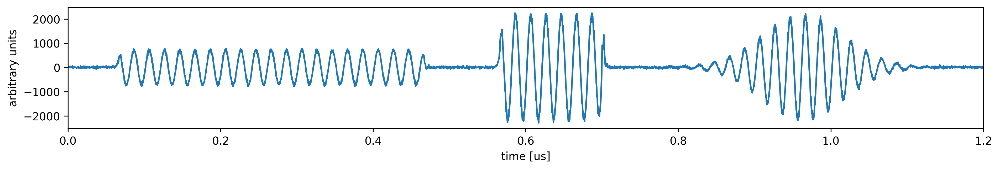

In [275]:
class MultiPulseProgram(AveragerProgramV2):
    def initialize(self, cfg):
        ro_ch = cfg['ro_ch']
        gen_ch = cfg['gen_ch']
        
        self.declare_gen(ch=gen_ch, nqz=1)
        self.declare_readout(ch=ro_ch, length=cfg['ro_len'])
        self.add_readoutconfig(ch=ro_ch, name="myro", freq=cfg['freq'], gen_ch=gen_ch,
                               outsel='input',
                              )

        self.add_pulse(ch=gen_ch, name="longpulse", ro_ch=ro_ch, 
                       style="const", 
                       freq=cfg['freq'], 
                       length=cfg['pulse_len'],
                       phase=cfg['phase'],
                       gain=cfg['gain']/6,
                      )
        self.add_pulse(ch=gen_ch, name="tallpulse", ro_ch=ro_ch, 
                       style="const", 
                       freq=cfg['freq'], 
                       length=cfg['pulse_len']/3,
                       phase=cfg['phase'],
                       gain=cfg['gain']/2,
                      )
        # gaussian pulse with same peak amplitude as the "tall" pulse
        # integral is sigma*sqrt(2*pi), we want integral to be pulse_len/3
        sigma = cfg['pulse_len']/np.sqrt(2*np.pi)/3
        self.add_gauss(ch=gen_ch, name="gauss", sigma=sigma, length=sigma*8)
        self.add_pulse(ch=gen_ch, name="gausspulse", ro_ch=ro_ch,
                       style="arb", 
                       freq=cfg['freq'], 
                       envelope="gauss",
                       phase=cfg['phase'],
                       gain=cfg['gain'],
                      )        
        # configure the readout
        self.send_readoutconfig(ch=cfg['ro_ch'], name="myro", t=0)
        
    def body(self, cfg):
        self.trigger(ddr4=True, mr=True, t=cfg['trig_time']-0.2)
        self.trigger(ros=[cfg['ro_ch']], pins=[0], t=cfg['trig_time'])

        if 0 in cfg['pulses']:
            self.pulse(ch=cfg['gen_ch'], name="longpulse", t=0)
            self.delay_auto(0.1, ros=False)
        
        if 1 in cfg['pulses']:
            self.pulse(ch=cfg['gen_ch'], name="tallpulse", t=0)
            self.delay_auto(0.05, ros=False)
        
        if 2 in cfg['pulses']:
            self.pulse(ch=cfg['gen_ch'], name="gausspulse", t=0)

config = {'gen_ch': GEN_CH,
          'ro_ch': RO_CH,
          'freq': 50,
          'trig_time': TRIG_TIME-0.1,
          'ro_len': 2,
          'pulse_len': 0.4,
          'phase': 0,
          'gain': 1.0,
          'pulses': [0,1,2],
         }

prog = MultiPulseProgram(soccfg, reps=1, final_delay=0.5, cfg=config)

n_transfers = 1000 # each transfer (aka burst) is 256 decimated samples
# Arm the buffers
soc.arm_ddr4(ch=RO_CH, nt=n_transfers)
soc.arm_mr(ch=RO_CH)

iq_list = prog.acquire_decimated(soc, soft_avgs=10)
t = prog.get_time_axis(ro_index=0)
# iq = iq_list[0]
# plt.plot(t, iq[:,0], label="I value")
# plt.plot(t, iq[:,1], label="Q value")
# plt.plot(t, np.abs(iq.dot([1,1j])), label="magnitude")
# plt.legend()
# plt.ylabel("arbitrary units")
# plt.xlabel("us");

plt.figure(dpi=300, figsize=(15,2))
real_mr = soc.get_mr()[:,0]
t = prog.get_time_axis_mr(0, real_mr)
plt.plot(t, real_mr)
plt.xlabel("time [us]")
plt.ylabel("arbitrary units")
# plt.ylim([-1500,1500]);
plt.xlim([0,1.2]);

In [224]:
from numpy.fft import rfft, fftshift, fftfreq

def plot_fft(soc, soccfg):
    fig, axes = plt.subplots(2,1,figsize=(6,6), dpi=600)
    real_mr = soc.get_mr()[:,0]
    t = prog.get_time_axis_mr(0, real_mr)
    
    plot = axes[0]
    plot.plot(t, real_mr)
    plot.set_xlabel("time [us]")
    plot.set_ylabel("arbitrary units")
    
    plot = axes[1]
    sp = rfft(real_mr)
    power = 20*np.log10(np.abs(sp))
    power -= power.max()
    freq = np.fft.rfftfreq(real_mr.shape[0], d=1/soccfg['readouts'][RO_CH]['fs'])
    plot.plot(freq, power)
    plot.set_xlabel("frequency [MHz]")
    plot.set_ylabel("relative power [dB]")
    plot.set_xlim([config['freq']*0.8, config['freq']*1.2]);
    plot.set_ylim([-30, 5]);
    # plt.legend();

  0%|          | 0/10 [00:00<?, ?it/s]

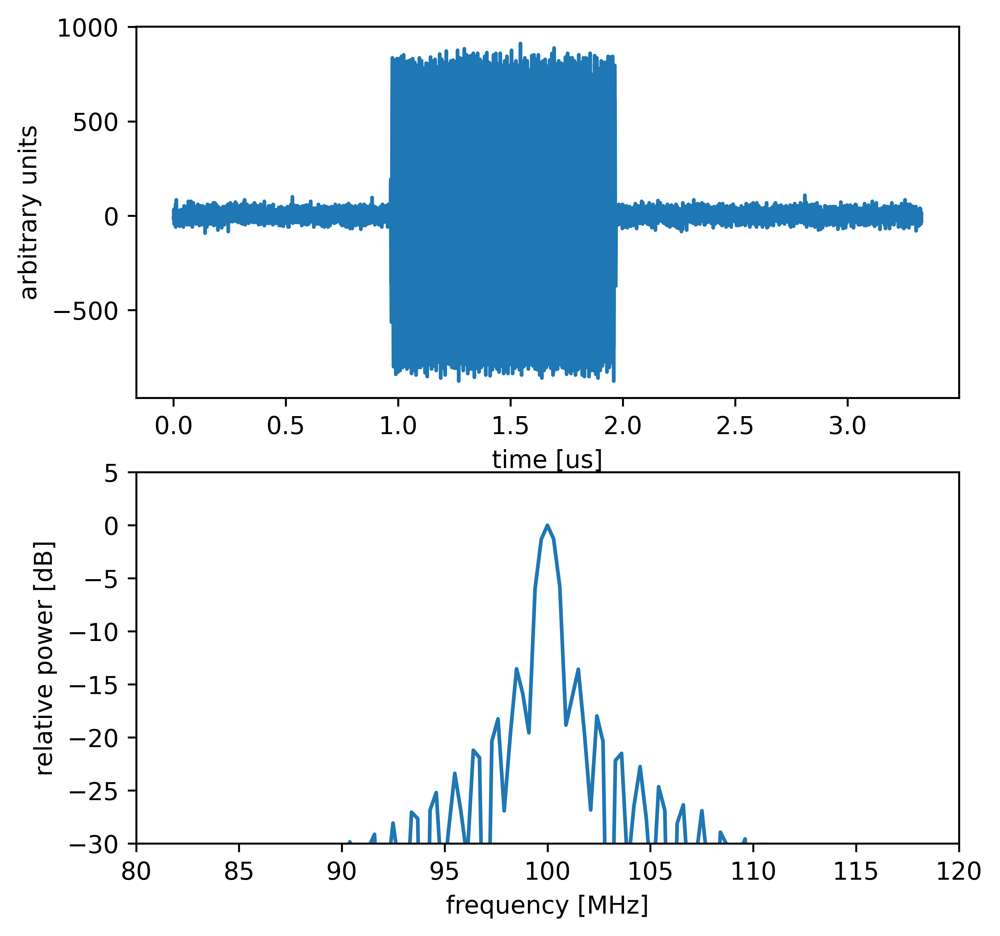

In [229]:
config = {'gen_ch': GEN_CH,
          'ro_ch': RO_CH,
          'freq': 100,
          'trig_time': TRIG_TIME-1.0,
          'ro_len': 2,
          'pulse_len': 1.0,
          'phase': 0,
          'gain': 1.0,
          'pulses': [0],
         }
prog = MultiPulseProgram(soccfg, reps=1, final_delay=0.5, cfg=config)

# Arm the buffers
soc.arm_mr(ch=RO_CH)
iq_list = prog.acquire_decimated(soc, soft_avgs=10)
plot_fft(soc, soccfg)

  0%|          | 0/10 [00:00<?, ?it/s]

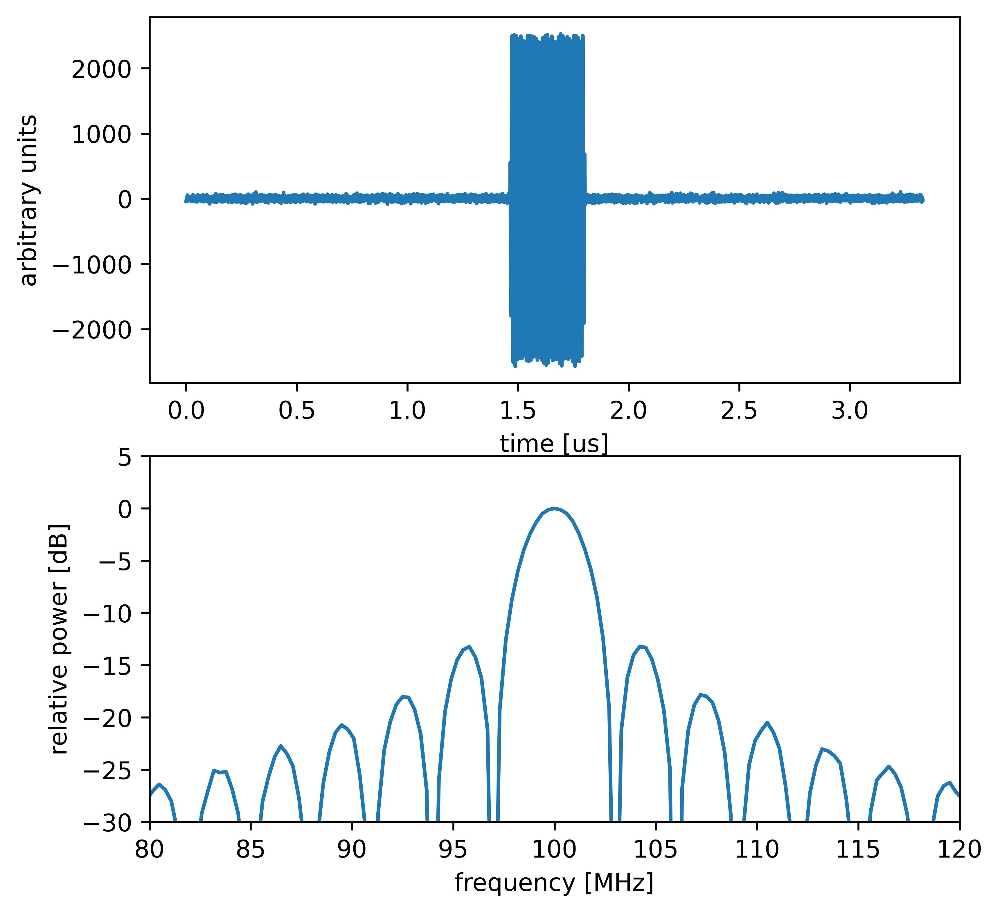

In [230]:
config = {'gen_ch': GEN_CH,
          'ro_ch': RO_CH,
          'freq': 100,
          'trig_time': TRIG_TIME-1.5,
          'ro_len': 2,
          'pulse_len': 1.0,
          'phase': 0,
          'gain': 1.0,
          'pulses': [1],
         }
prog = MultiPulseProgram(soccfg, reps=1, final_delay=0.5, cfg=config)

# Arm the buffers
soc.arm_mr(ch=RO_CH)
iq_list = prog.acquire_decimated(soc, soft_avgs=10)
plot_fft(soc, soccfg)

  0%|          | 0/10 [00:00<?, ?it/s]

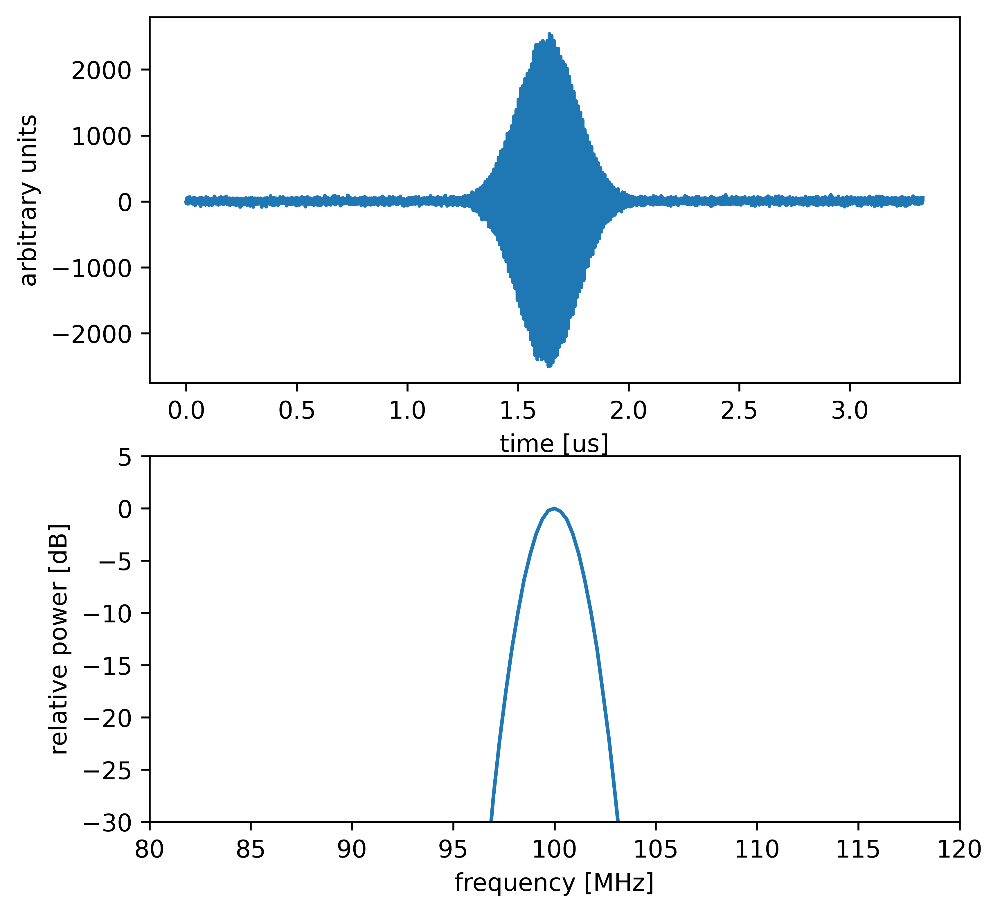

In [231]:
config = {'gen_ch': GEN_CH,
          'ro_ch': RO_CH,
          'freq': 100,
          'trig_time': TRIG_TIME-1.0,
          'ro_len': 2,
          'pulse_len': 1.0,
          'phase': 0,
          'gain': 1.0,
          'pulses': [2],
         }
prog = MultiPulseProgram(soccfg, reps=1, final_delay=0.5, cfg=config)

# Arm the buffers
soc.arm_mr(ch=RO_CH)
iq_list = prog.acquire_decimated(soc, soft_avgs=10)
plot_fft(soc, soccfg)

  0%|          | 0/1 [00:00<?, ?it/s]

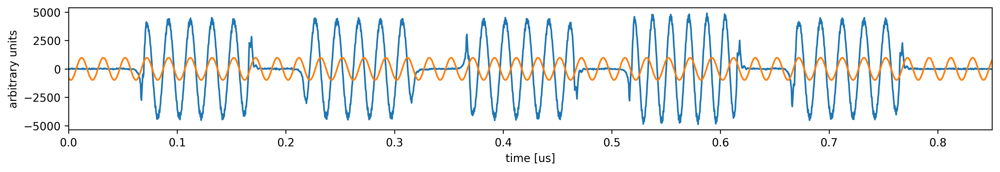

In [336]:
class MultiPulseProgram2(AveragerProgramV2):
    def initialize(self, cfg):
        ro_ch = cfg['ro_ch']
        gen_ch = cfg['gen_ch']
        
        self.declare_gen(ch=gen_ch, nqz=1)
        self.declare_readout(ch=ro_ch, length=cfg['ro_len'])
        self.add_readoutconfig(ch=ro_ch, name="myro", freq=cfg['freq'], gen_ch=gen_ch,
                               outsel='input',
                              )

        self.add_pulse(ch=gen_ch, name="pulse1", ro_ch=ro_ch, 
                       style="const", 
                       freq=cfg['freq'], 
                       length=cfg['pulse_len'],
                       phase=0,
                       gain=cfg['gain'],
                      )
        self.add_pulse(ch=gen_ch, name="pulse2", ro_ch=ro_ch, 
                       style="const", 
                       freq=cfg['freq'], 
                       length=cfg['pulse_len'],
                       phase=90,
                       gain=cfg['gain'],
                      )
        self.add_pulse(ch=gen_ch, name="pulse3", ro_ch=ro_ch, 
                       style="const", 
                       freq=cfg['freq'], 
                       length=cfg['pulse_len'],
                       phase=0,
                       gain=-cfg['gain'],
                      )
        self.add_pulse(ch=gen_ch, name="pulse4", ro_ch=ro_ch, 
                       style="const", 
                       freq=cfg['freq']*1.2, 
                       length=cfg['pulse_len'],
                       phase=0,
                       gain=cfg['gain'],
                      )

        # configure the readout
        self.send_readoutconfig(ch=cfg['ro_ch'], name="myro", t=0)
        
    def body(self, cfg):
        self.trigger(ddr4=True, mr=True, t=cfg['trig_time']-0.2)
        self.trigger(ros=[cfg['ro_ch']], pins=[0], t=cfg['trig_time'])

        self.pulse(ch=cfg['gen_ch'], name="pulse1", t=0)
        self.delay_auto(cfg['pulse_len']/2, ros=False)
    
        self.pulse(ch=cfg['gen_ch'], name="pulse2", t=0)
        self.delay_auto(cfg['pulse_len']/2, ros=False)
    
        self.pulse(ch=cfg['gen_ch'], name="pulse3", t=0)
        self.delay_auto(cfg['pulse_len']/2, ros=False)

        self.pulse(ch=cfg['gen_ch'], name="pulse4", t=0)
        self.delay_auto(cfg['pulse_len']/2, ros=False)

        self.pulse(ch=cfg['gen_ch'], name="pulse1", t=0)
        self.delay_auto(cfg['pulse_len']/2, ros=False)

config = {'gen_ch': GEN_CH,
          'ro_ch': RO_CH,
          'freq': 50,
          'trig_time': TRIG_TIME-0.1,
          'ro_len': 2,
          'pulse_len': 0.1,
          'phase': 0,
          'gain': 1.0,
          'pulses': [0,1,2],
         }

prog = MultiPulseProgram2(soccfg, reps=1, final_delay=0.5, cfg=config)

n_transfers = 1000 # each transfer (aka burst) is 256 decimated samples
# Arm the buffers
soc.arm_ddr4(ch=RO_CH, nt=n_transfers)
soc.arm_mr(ch=RO_CH)

iq_list = prog.acquire_decimated(soc, soft_avgs=1)
t = prog.get_time_axis(ro_index=0)
# iq = iq_list[0]
# plt.plot(t, iq[:,0], label="I value")
# plt.plot(t, iq[:,1], label="Q value")
# plt.plot(t, np.abs(iq.dot([1,1j])), label="magnitude")
# plt.legend()
# plt.ylabel("arbitrary units")
# plt.xlabel("us");

plt.figure(dpi=300, figsize=(15,2))
real_mr = soc.get_mr()[:,0]
t = prog.get_time_axis_mr(0, real_mr)
plt.plot(t, real_mr)
plt.xlabel("time [us]")
plt.ylabel("arbitrary units")
# plt.ylim([-1500,1500]);

fs = soccfg['readouts'][RO_CH]['fs']
firstpulse_phase = np.angle((real_mr*np.exp(2j*np.pi*config['freq']*t))[:int(0.2*fs)].mean())
plt.plot(t, real_mr.max()*(0.2*np.cos(t*2*np.pi*config['freq'] - firstpulse_phase)))
plt.xlim([0,0.85]);

In [295]:
fs = soccfg['readouts'][RO_CH]['fs']
nsamp = int(0.2*fs)
firstpulse_phase = np.angle((real_mr*np.exp(2j*np.pi*config['freq']*t))[:nsamp].mean())

-1.1804831250506234

In [149]:
def plot_s21(soc, soccfg, f_start, f_end, cal_range=0.1):
    class FreqSweepProgram(AveragerProgramV2):
        def initialize(self, cfg):
            ro_ch = cfg['ro_ch']
            gen_ch = cfg['gen_ch']
            
            self.declare_gen(ch=gen_ch, nqz=cfg['nqz'])
            self.declare_readout(ch=ro_ch, length=cfg['ro_len'])
    
            self.add_loop("myloop", self.cfg["steps"])
            self.add_readoutconfig(ch=ro_ch, name="myro", freq=cfg['freq'], gen_ch=gen_ch)
    
            self.add_pulse(ch=gen_ch, name="mypulse", ro_ch=ro_ch, 
    #                        style="flat_top", 
                           style="const", 
    #                        envelope="ramp",
                           freq=cfg['freq'], 
                           length=cfg['pulse_len'],
                           phase=cfg['phase'],
                           gain=cfg['gain'], 
                          )
    #         self.trigger(pins=list(range(8,16)),t=0)
            
        def body(self, cfg):
            # if you delay the config by too long, you can see the readout get reconfigured in the middle of your pulse
            self.send_readoutconfig(ch=cfg['ro_ch'], name="myro", t=0)
            self.pulse(ch=cfg['gen_ch'], name="mypulse", t=0)
            self.trigger(ros=[cfg['ro_ch']], pins=[0], t=cfg['trig_time'])
    
    # do a sweep with 5 points and plot decimated
    config = {'steps': 5,
              'gen_ch': GEN_CH,
              'ro_ch': RO_CH,
              'freq': QickSweep1D("myloop", f_start, f_start+cal_range),
              'nqz': 1,
              'trig_time': 3.0,
              'ro_len': 27,
              'pulse_len': 25.0,
              'phase': 0,
              'gain': 1.0,
             }
    
    # prog = FreqSweepProgram(soccfg, reps=1, final_delay=10.0, cfg=config)
    
    # iq_list = prog.acquire_decimated(soc, soft_avgs=1)
    # t = prog.get_time_axis(ro_index=0)
    # fig, axes = plt.subplots(3, 1, figsize=(9,9))
    # for ii, iq in enumerate(iq_list[0]):
    #     axes[0].plot(t, iq[:,0], label="I value, step %d"%(ii))
    #     axes[1].plot(t, iq[:,1], label="Q value, step %d"%(ii))
    #     axes[2].plot(t, np.abs(iq.dot([1,1j])), label="mag, step %d"%(ii))
    # for plot in axes:
    #     plot.legend()
    #     plot.set_ylabel("amplitude [ADU]")
    #     plot.set_xlabel("time [us]");
    
    config['steps']=1001
    
    prog = FreqSweepProgram(soccfg, reps=10, final_delay=1.0, cfg=config)
    freqs = prog.get_pulse_param('myro', 'freq', as_array=True)
    iq_list = prog.acquire(soc, soft_avgs=1, progress=True)
    # plt.plot(np.angle(iq_list[0][0].dot([1,1j]), deg=True))
    
    # plt.plot(iq_list[0][0,:,0], iq_list[0][0,:,1], '.')
    # plt.ylabel("Q [ADU]")
    # plt.xlabel("I [ADU]");
    
    iq_complex = iq_list[0][0].dot([1,1j])
    phases = np.unwrap(np.angle(iq_complex))/(2*np.pi)
    
    # plt.plot(freqs, phases)
    # plt.ylabel("Phase [cycles]")
    # plt.xlabel("Frequency [MHz]")
    
    print("phase step (cycles):", phases[1]-phases[0])
    
    a = np.vstack([freqs, np.ones_like(freqs)]).T
    phase_delay = np.linalg.lstsq(a, phases, rcond=None)[0][0]
    print("relative delay %.4f us"%(phase_delay))
    
    config['freq'] = QickSweep1D("myloop", f_start, f_end)
    
    config['steps'] = 1001
    
    prog = FreqSweepProgram(soccfg, reps=10, final_delay=10.0, cfg=config)
    freqs = prog.get_pulse_param('myro', 'freq', as_array=True)
    iq_list = prog.acquire(soc, soft_avgs=1, progress=True)
    iq_complex = iq_list[0][0].dot([1,1j])
    
    iq_rotated = iq_complex*np.exp(-1j*freqs*2*np.pi*phase_delay)
    
    phases_corrected = np.unwrap(np.angle(iq_rotated))/(2*np.pi)
    # phases_corrected = np.angle(iq_rotated)/(2*np.pi)
    
    fig, plot = plt.subplots()
    plot.semilogy(freqs, np.abs(iq_rotated), label="amplitude")
    # plot.set_xlim([F_RO-5, F_RO+5])
    ax2 = plot.twinx()  # instantiate a second axes that shares the same x-axis
    ax2.plot(freqs, phases_corrected, color='red', label='phase')
    
    plot.set_ylabel("amplitude [ADU]")
    plot.set_xlabel("frequency [MHz]")
    ax2.set_ylabel("phase [cycles]");
    return freqs, iq_rotated

  0%|          | 0/10010 [00:00<?, ?it/s]

phase step (cycles): -0.00020062620525129748
relative delay -2.1022 us


  0%|          | 0/10010 [00:00<?, ?it/s]

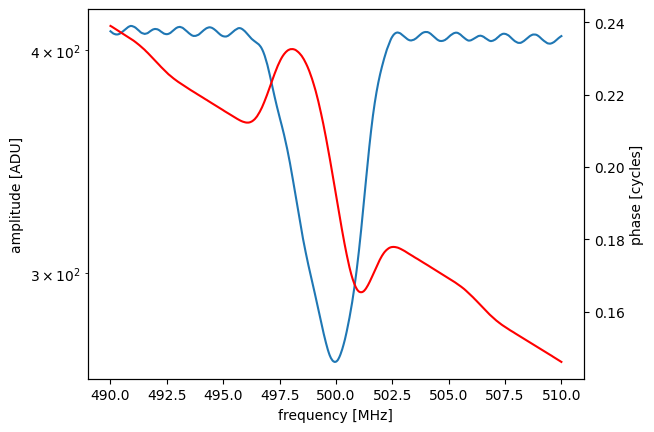

In [252]:
F_RO = 500
DF_RO = 1
RES_C0 = 0.3
RES_C1 = 0.1

soc.config_resonator(f=F_RO, c0=RES_C0, c1=RES_C1)
freqs, iq = plot_s21(soc, soccfg, F_RO-10, F_RO+10)

  0%|          | 0/10010 [00:00<?, ?it/s]

phase step (cycles): -0.00020455472827124455
relative delay -2.0982 us


  0%|          | 0/10010 [00:00<?, ?it/s]

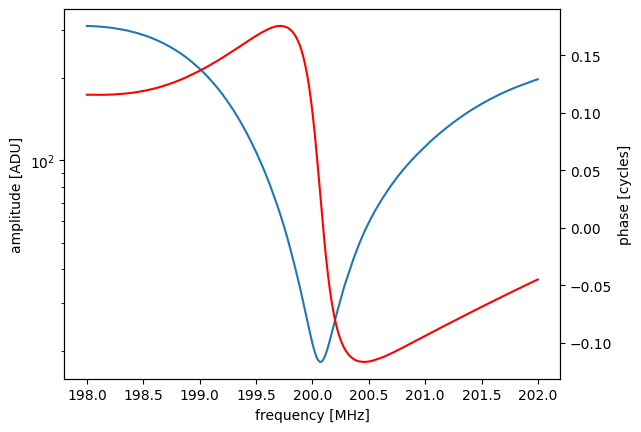

In [358]:
F_RO = 200
DF_RO = 1
RES_C0 = 0.99
RES_C1 = 0.1

soc.config_resonator(f=F_RO, c0=RES_C0, c1=RES_C1, df=DF_RO)
freqs, iq = plot_s21(soc, soccfg, F_RO-2, F_RO+2)

  0%|          | 0/1 [00:00<?, ?it/s]

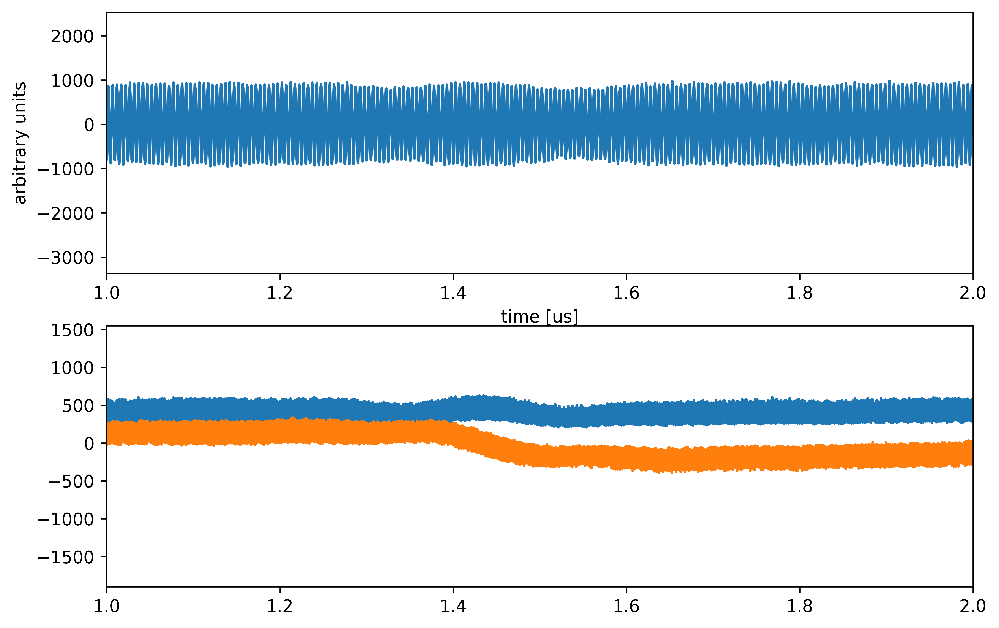

In [361]:
# soc.disable_resonator()
soc.config_resonator(f=F_RO, c0=RES_C0, c1=RES_C1, df=DF_RO)

class JumpProgram(AveragerProgramV2):
    def initialize(self, cfg):
        ro_ch = cfg['ro_ch']
        gen_ch = cfg['gen_ch']
        
        self.declare_gen(ch=gen_ch, nqz=1)
        self.declare_readout(ch=ro_ch, length=cfg['ro_len'])
        self.add_readoutconfig(ch=ro_ch, name="myro", freq=cfg['freq'], gen_ch=gen_ch,
                               outsel='input',
                              )
        self.add_pulse(ch=gen_ch, name="mypulse", ro_ch=ro_ch, 
                       style="const", 
                       freq=cfg['freq'], 
                       length=cfg['pulse_len'],
                       phase=cfg['phase'],
                       gain=cfg['gain'],
                      )
        # configure the readout
        self.send_readoutconfig(ch=cfg['ro_ch'], name="myro", t=0)
        
    def body(self, cfg):
        self.trigger(ddr4=True, mr=True, t=cfg['trig_time']-0.2)
        self.trigger(ros=[cfg['ro_ch']], pins=[0], t=cfg['trig_time'])

        self.pulse(ch=cfg['gen_ch'], name="mypulse", t=0)
        self.trigger(pins=list(range(8,16)), t=cfg['jump_time'])

config = {'gen_ch': GEN_CH,
          'ro_ch': RO_CH,
          'freq': F_RO-DF_RO/2,
          'trig_time': TRIG_TIME-0.2,
          'jump_time': 2.0,
          'ro_len': 3,
          'pulse_len': 2.0,
          'phase': 0,
          'gain': 1.0,
         }

prog = JumpProgram(soccfg, reps=1, final_delay=0.5, cfg=cfg)

# Arm the buffers
soc.arm_mr(ch=RO_CH)
iq_list = prog.acquire_decimated(soc, soft_avgs=1)

plot_readout(soc, config['freq'],[1.0, 2.0])

  0%|          | 0/10010 [00:00<?, ?it/s]

phase step (cycles): -0.0002039974304887393
relative delay -2.1047 us


  0%|          | 0/10010 [00:00<?, ?it/s]

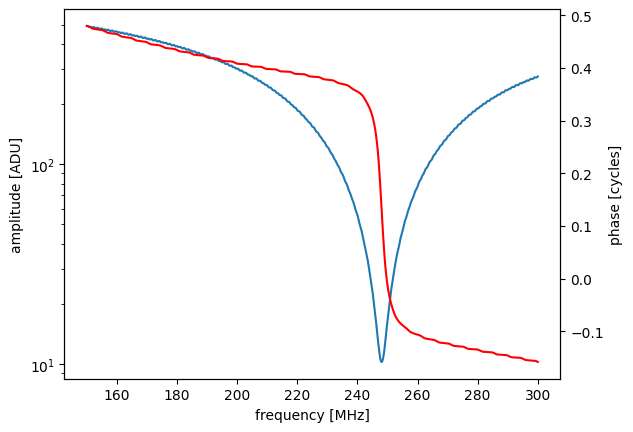

In [208]:
soc.disable_resonator()

freqs, iqs = plot_s21(soc, soccfg, 150, 300)

FWHM estimate: 247.95 -33.67390115098327 21.299999999999983
Lorentzian fit: [   18.8055047    248.4753342  -1527.68020466]


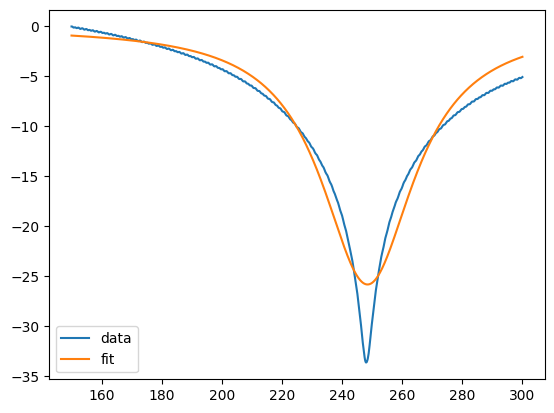

In [210]:
# fit a lorentzian to the power

def lorentzian(f, gamma, f0, A):
    return (A/np.pi) / (gamma) / (1 + np.power((f-f0)/(gamma),2.))

def FWHM_analytic(f, S21):
    f_min = f[np.argmin(S21)] #; print(f_min)
    S_min = np.min(S21) #; print(S_min)
    halfmax = S_min/2 #; print(halfmax)
    hm_f_lo = f[f<f_min][np.argmin(np.abs(S21[f<f_min]-halfmax))] #; print(hm_f_lo)
    hm_f_hi = f[f>f_min][np.argmin(np.abs(S21[f>f_min]-halfmax))] #; print(hm_f_hi)
    FWHM = hm_f_hi - hm_f_lo
    return f_min, S_min, FWHM

dbs = 20*np.log10(np.abs(iqs))
dbs -= np.max(dbs)
plt.plot(freqs, dbs, label='data')

f_min , S_min, FWHM = FWHM_analytic(freqs, dbs)
guess = [FWHM , f_min , -30]
gss_lorentzian = lorentzian(freqs, *guess)
popt, pcov = curve_fit(lorentzian, freqs, dbs, maxfev = 100000, p0 = guess)
fit_lorentzian = lorentzian(freqs, *popt)

plt.plot(freqs, fit_lorentzian, label='fit')
plt.legend()
# plt.xlim([popt[1]-5*popt[0], popt[1]+5*popt[0]])
print("FWHM estimate:", f_min , S_min, FWHM)
print("Lorentzian fit:", popt)

pole-zero fit: [2.49620091e+02 1.02284588e+00 3.00355575e-01 6.93338471e+02]


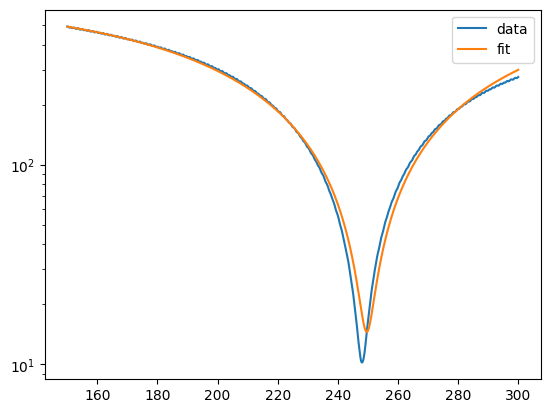

In [211]:
# fit a pole-zero function to the magnitude
# gives a good fit, though we clearly don't know how to normalize the parameters correctly

def polezero(f, f0, c0, c1, G):
    f_scale = 100 # this is probably related to the time interval used in the IIR or something
    z = np.exp(1j*f/f_scale)
    # leo applies an overall G0 = (1+c1)/(1+c0) which seems to normalize to 1 far from the resonance
    G0 = (1+c1)/(1+c0)
    return G*G0*np.abs((z-c0*np.exp(1j*f0/f_scale))/(z-c1*np.exp(1j*f0/f_scale)))


mags = np.abs(iqs)
plt.semilogy(freqs, mags, label='data')

guess = [f_min, 0.9, 0.1, np.max(mags)]
popt, pcov = curve_fit(polezero, freqs, mags, maxfev = 100000, p0 = guess)
fit_polezero = polezero(freqs, *popt)
# plt.semilogy(freqs, polezero(freqs, *guess), label='guess')

plt.semilogy(freqs, fit_polezero, label='fit')
plt.legend()

print("pole-zero fit:", popt)
f_res = popt[0]

In [240]:
class ReadoutProgram(AveragerProgramV2):
    def initialize(self, cfg):
        ro_ch = cfg['ro_ch']
        gen_ch = cfg['gen_ch']
        
        self.declare_gen(ch=gen_ch, nqz=1)
        self.declare_readout(ch=ro_ch, length=cfg['ro_len'])
        self.add_readoutconfig(ch=ro_ch, name="myro", freq=cfg['freq'], gen_ch=gen_ch,
                               outsel='input',
                              )

        self.add_pulse(ch=gen_ch, name="mypulse", ro_ch=ro_ch, 
                       style="const", 
                       freq=cfg['freq'], 
                       length=cfg['pulse_len'],
                       phase=cfg['phase'],
                       gain=cfg['gain'],
                      )
        # configure the readout
        self.send_readoutconfig(ch=cfg['ro_ch'], name="myro", t=0)
        
    def body(self, cfg):
        self.trigger(ddr4=True, mr=True, t=cfg['trig_time']-0.2)
        self.trigger(ros=[cfg['ro_ch']], pins=[0], t=cfg['trig_time'])

        self.pulse(ch=cfg['gen_ch'], name="mypulse", t=0)

config = {'gen_ch': GEN_CH,
          'ro_ch': RO_CH,
          'freq': F_RO,
          'trig_time': TRIG_TIME-0.2,
          'ro_len': 3,
          'pulse_len': 0.3,
          'phase': 0,
          'gain': 1.0,
         }

prog = ReadoutProgram(soccfg, reps=1, final_delay=0.5, cfg=config)

In [237]:
from scipy.signal import butter, filtfilt

def lowpass(data, cutoff, order=1):
    fs = soccfg['readouts'][RO_CH]['fs']
    nyq = fs/2
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return filtfilt(b, a, data)

def plot_readout(soc, f, xlim=None):
    real_mr = soc.get_mr()[:,0]
    t = prog.get_time_axis_mr(0, real_mr)

    fig, axes = plt.subplots(2,1,figsize=(9,6), dpi=600)
    plot = axes[0]
    plot.plot(t, real_mr)
    plot.set_xlabel("time [us]")
    plot.set_ylabel("arbitrary units")
    # plt.ylim([-1500,1500]);
    if xlim is not None: plot.set_xlim(xlim)

    plot = axes[1]
    iq = real_mr * np.exp(2j*np.pi*f*t)
    mean_iq = iq.mean()
    iq /= (mean_iq/np.abs(mean_iq))
    # plot.plot(np.real(iq))
    plot.plot(t, lowpass(np.real(iq), f*1.5))
    plot.plot(t, lowpass(np.imag(iq), f*1.5))
    if xlim is not None: plot.set_xlim(xlim)


  0%|          | 0/1 [00:00<?, ?it/s]

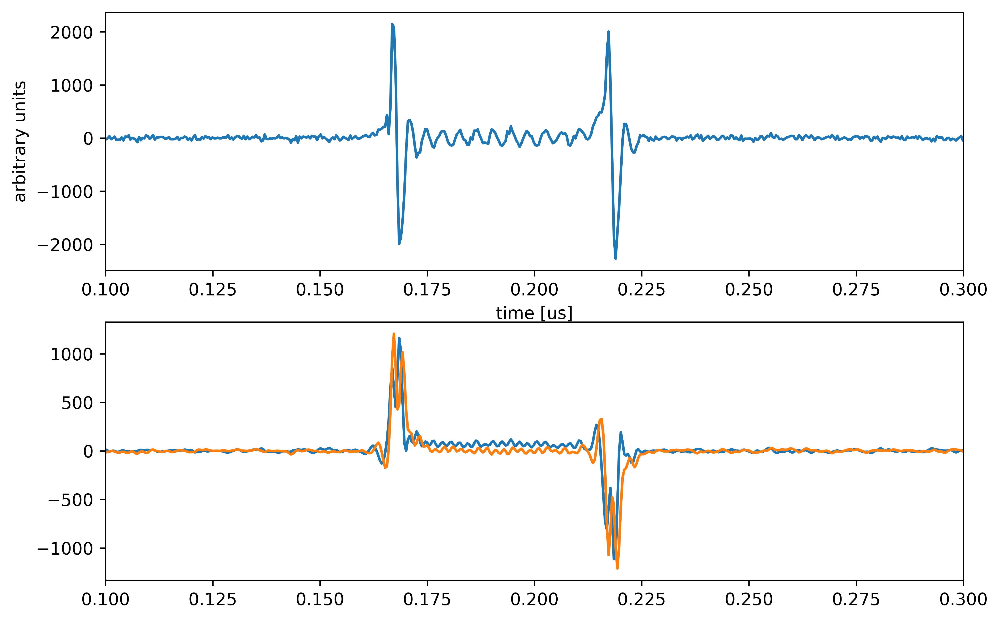

In [212]:
soc.disable_resonator()

cfg = config.copy()
cfg['freq'] = f_res
cfg['pulse_len'] = 0.05

prog = ReadoutProgram(soccfg, reps=1, final_delay=0.5, cfg=cfg)

# Arm the buffers
soc.arm_mr(ch=RO_CH)
iq_list = prog.acquire_decimated(soc, soft_avgs=1)

plot_readout(soc, cfg['freq'], [0.1, 0.3])

  0%|          | 0/1 [00:00<?, ?it/s]

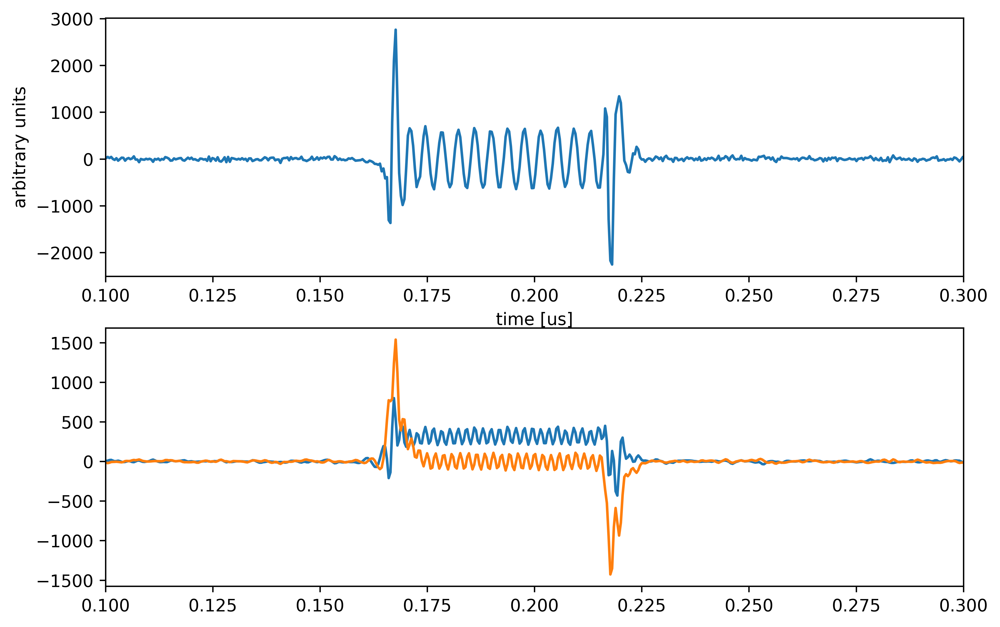

In [213]:
soc.disable_resonator()

cfg = config.copy()
cfg['freq'] = f_res+10
cfg['pulse_len'] = 0.05

prog = ReadoutProgram(soccfg, reps=1, final_delay=0.5, cfg=cfg)

# Arm the buffers
soc.arm_mr(ch=RO_CH)
iq_list = prog.acquire_decimated(soc, soft_avgs=1)

plot_readout(soc, cfg['freq'], [0.1, 0.3])

  0%|          | 0/1 [00:00<?, ?it/s]

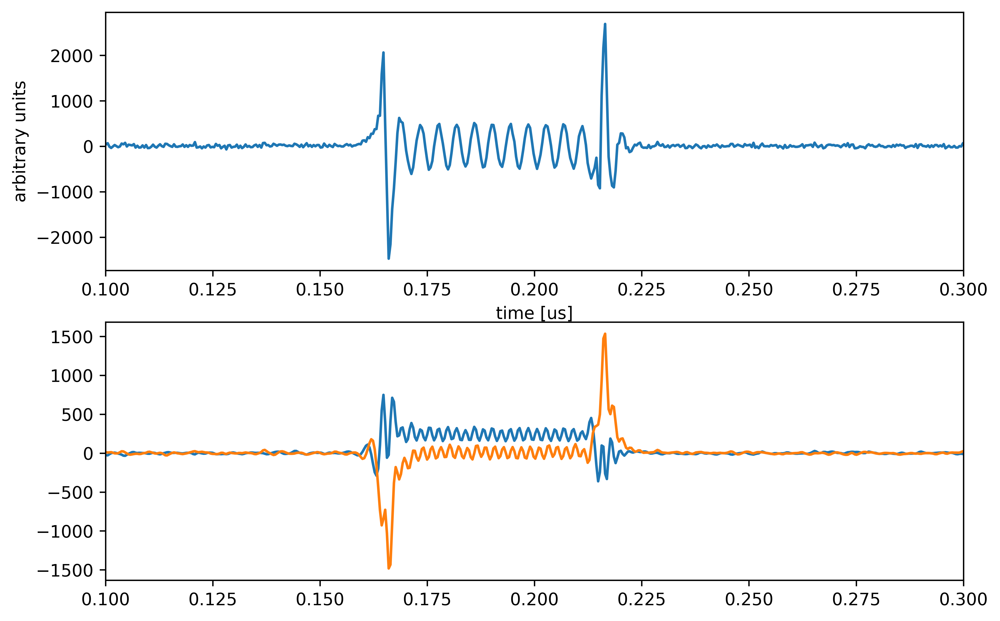

In [217]:
soc.disable_resonator()

cfg = config.copy()
cfg['freq'] = f_res-10
cfg['pulse_len'] = 0.05

prog = ReadoutProgram(soccfg, reps=1, final_delay=0.5, cfg=cfg)

# Arm the buffers
soc.arm_mr(ch=RO_CH)
iq_list = prog.acquire_decimated(soc, soft_avgs=1)

plot_readout(soc, cfg['freq'], [0.1, 0.3])

  0%|          | 0/1 [00:00<?, ?it/s]

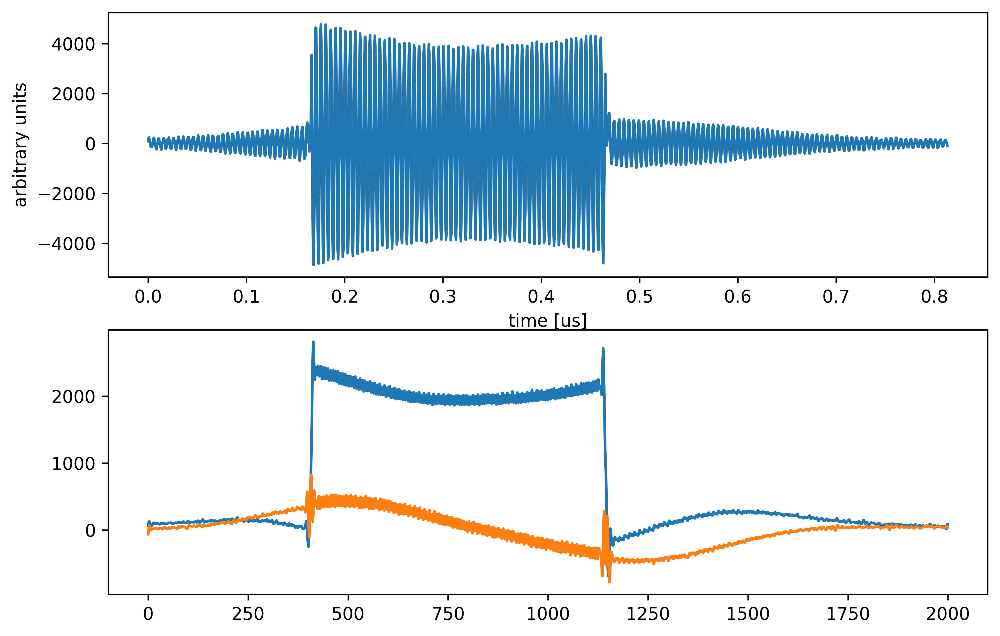

In [123]:
soc.config_resonator(f=F_RO-DF_RO, c0=RES_C0, c1=RES_C1)

# Arm the buffers
soc.arm_mr(ch=RO_CH)
iq_list = prog.acquire_decimated(soc, soft_avgs=1)

plot_readout(soc)

  0%|          | 0/1 [00:00<?, ?it/s]

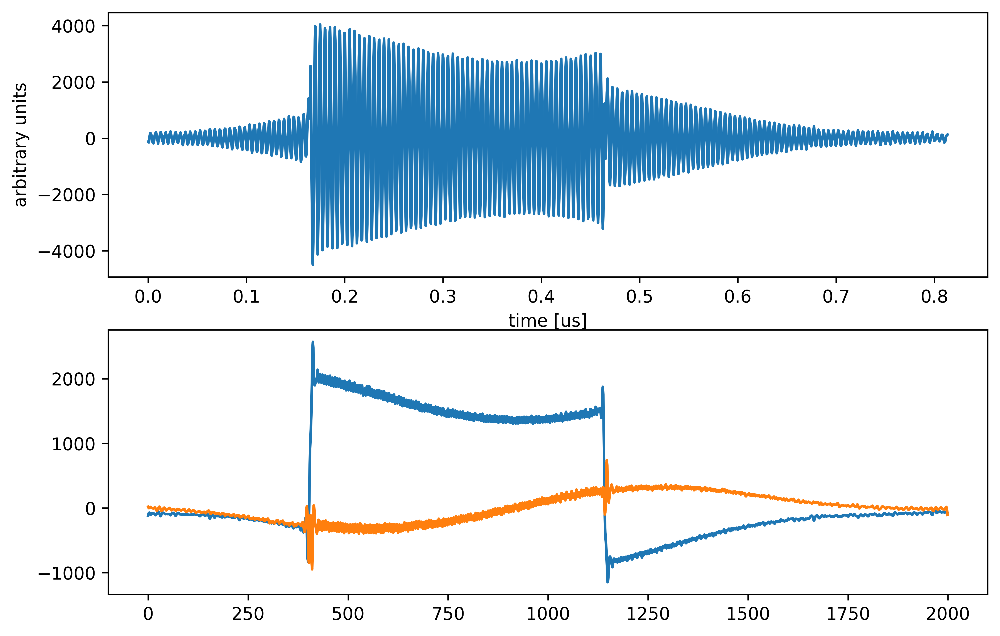

In [124]:
soc.config_resonator(f=F_RO, c0=RES_C0, c1=RES_C1)

# Arm the buffers
soc.arm_mr(ch=RO_CH)
iq_list = prog.acquire_decimated(soc, soft_avgs=1)

plot_readout(soc)

  0%|          | 0/1 [00:00<?, ?it/s]

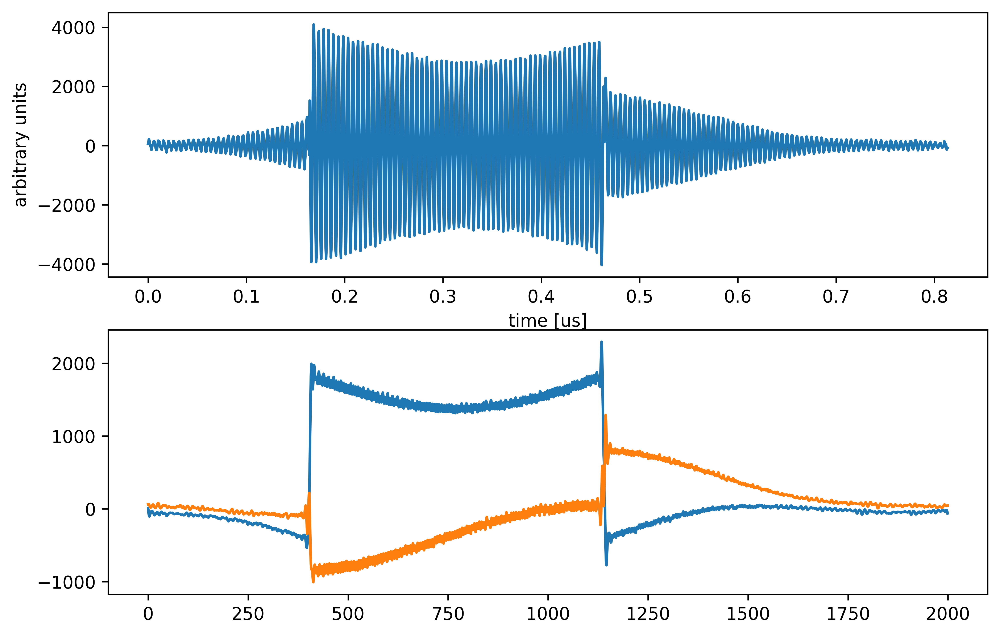

In [126]:
soc.config_resonator(f=F_RO+DF_RO, c0=RES_C0, c1=RES_C1)

# Arm the buffers
soc.arm_mr(ch=RO_CH)
iq_list = prog.acquire_decimated(soc, soft_avgs=1)

plot_readout(soc)

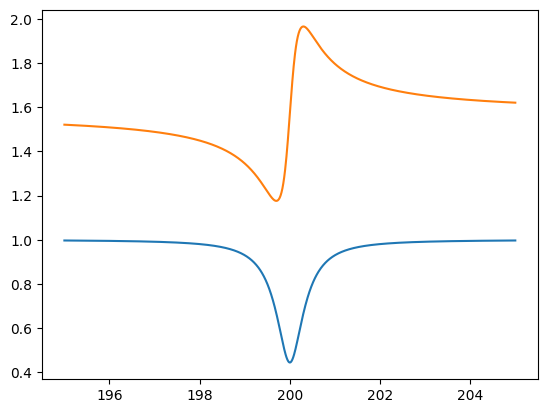

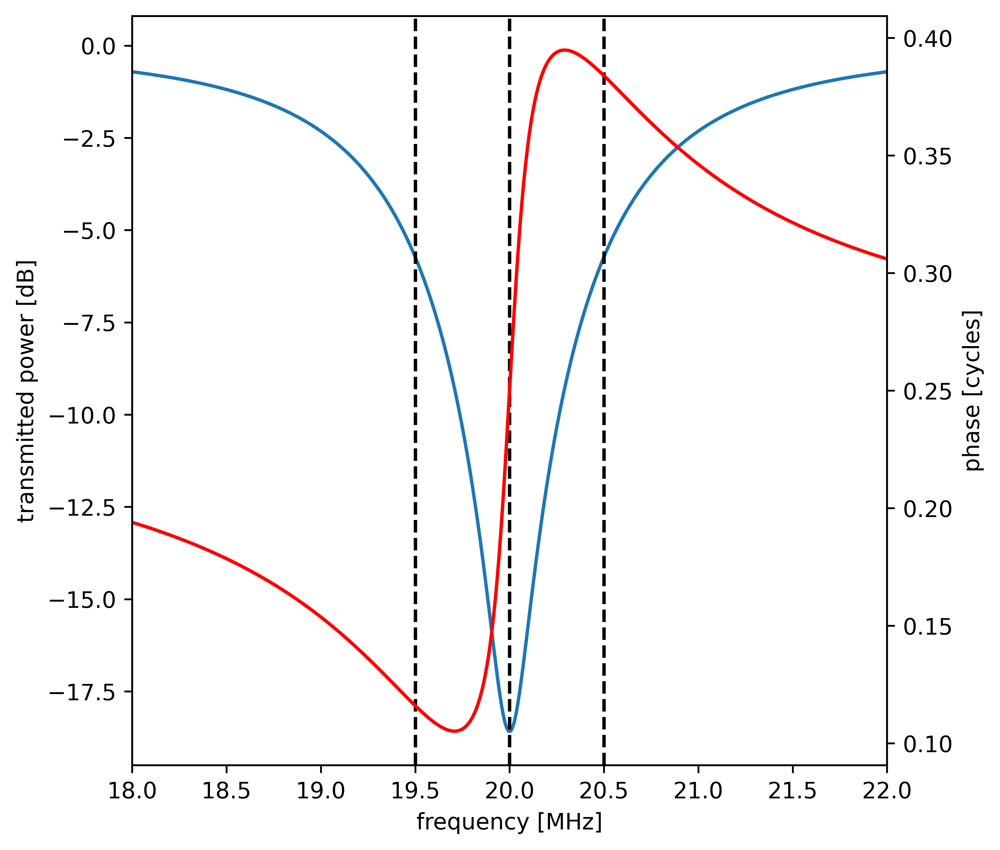

In [525]:
f_res = 20

def s21_analytic(f_res, f):
    k_inner = 0.2
    k_out = 1.5
    dw = f
    return 1j*(1-k_out/(k_inner+k_out+2.0j*(dw-f_res)))

f = np.linspace(f_res-5, f_res+5, 1000)
s21 = s21_analytic(f_res, f)

fig, axes = plt.subplots(1,1,figsize=(6,6), dpi=600)

plot = axes
# plot.plot(f, np.abs(s21))
# plot.plot(f, np.angle(s21)/(2*np.pi))

plot.plot(f, 20*np.log10(np.abs(s21)), label="amplitude")
ax2 = plot.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(f, np.angle(s21)/(2*np.pi), color='red', label='phase')

plot.set_ylabel("transmitted power [dB]")
plot.set_xlabel("frequency [MHz]")
ax2.set_ylabel("phase [cycles]");
plot.axvline(f_res-0.5, color='black', ls='--')
plot.axvline(f_res, color='black', ls='--')
plot.axvline(f_res+0.5, color='black', ls='--')
plot.set_xlim([f_res-2, f_res+2])
;

(-0.14028912771623503+0.20008327167354417j)

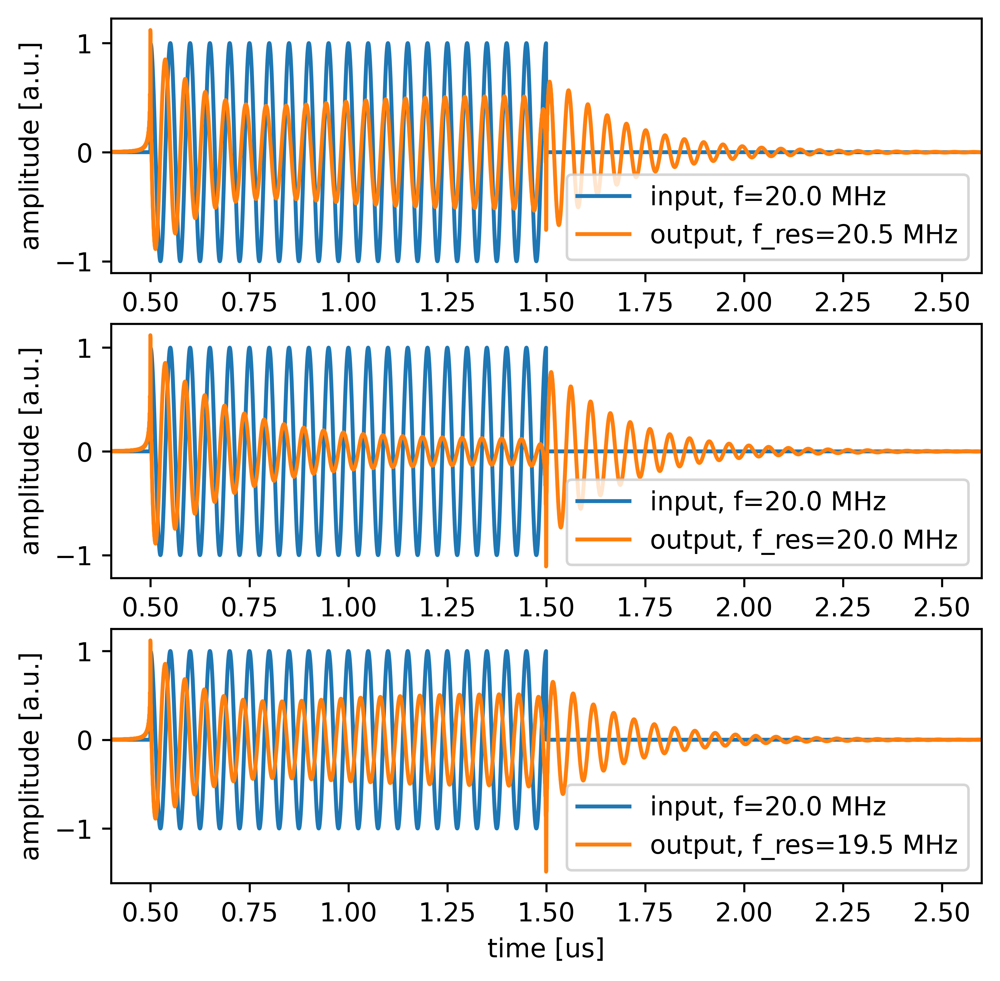

In [586]:
from scipy.signal import butter, filtfilt

def lowpass(data, fs, cutoff, order=3):
    nyq = fs/2
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return filtfilt(b, a, data)

max_t = 5
n = 10000
t = np.linspace(0,max_t,n)
envelope = np.heaviside(t-0.5, 1)*np.heaviside(1.5-t, 1)

def plot_response(plot, t, envelope, f_res, f_pulse, plot_iq=False):
    carrier = np.cos(2*np.pi*f_pulse*t)
    x_in = carrier*envelope
    if plot is not None:
        if plot_iq:
            plot.plot(t,x_in)
        else:
            plot.plot(t,x_in, label='input, f=%.1f MHz'%(f_pulse))
    
    dt = t.max()/(len(t)-1)
    freqs = np.fft.rfftfreq(n, dt)
    x_fft = np.fft.rfft(x_in)
    x_fft *= s21_analytic(f_res, freqs)
    x_out = np.fft.irfft(x_fft)
    if plot is not None:
        if plot_iq:
            plot.plot(t, np.real(x_out), color='tab:orange')
        else:
            plot.plot(t, np.real(x_out), label='output, f_res=%.1f MHz'%(f_res))
    
    iq = x_out / np.exp(2j*np.pi*f_pulse*t)
    # mean_iq = iq.mean()
    # iq /= (mean_iq/np.abs(mean_iq))
    iq_lowpass = lowpass(iq, 1/dt, f_pulse*1.2)
    
    if plot is not None:
        if plot_iq:
            plot.plot(t, np.real(iq_lowpass), label='in-phase', color='magenta')
            plot.plot(t, np.imag(iq_lowpass), label='quadrature', color='blue')
        plot.set_xlim([0.4,2.6])
        plot.set_xlabel("time [us]")
        plot.set_ylabel("amplitude [a.u.]")
        plot.legend(loc='lower right')
    return np.sum(iq_lowpass*envelope)/np.sum(envelope)

fig, axes = plt.subplots(3,1,figsize=(6,6), dpi=600)

plot_response(axes[0], t, envelope, f_res+0.5, f_res)
plot_response(axes[1], t, envelope, f_res, f_res)
plot_response(axes[2], t, envelope, f_res-0.5, f_res)


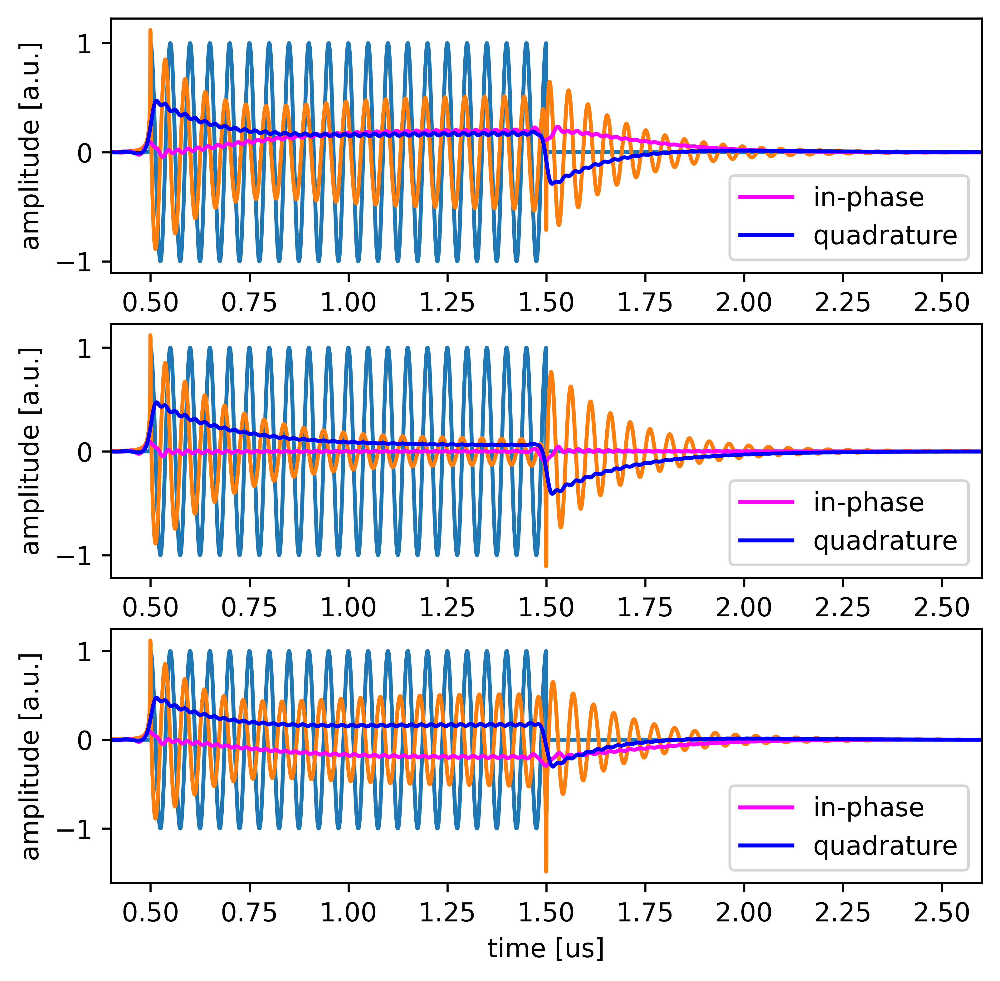

In [587]:
fig, axes = plt.subplots(3,1,figsize=(6,6), dpi=600)

iq_list=[]
iq_list.append(plot_response(axes[0], t, envelope, f_res+0.5, f_res, plot_iq=True))
iq_list.append(plot_response(axes[1], t, envelope, f_res, f_res, plot_iq=True))
iq_list.append(plot_response(axes[2], t, envelope, f_res+-0.5, f_res, plot_iq=True))

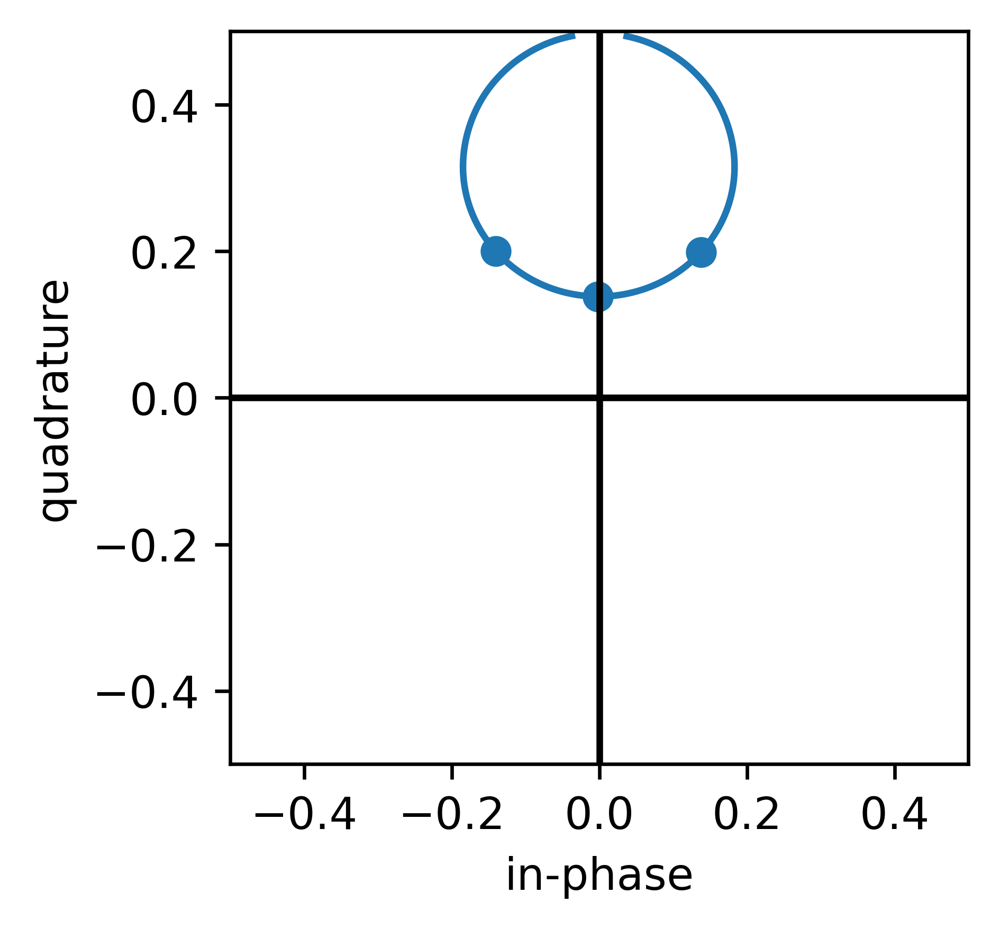

In [590]:
iq_list = np.array(iq_list)
freqs_full = np.linspace(f_res+10, f_res-10, 1000)
iq_list_full = [plot_response(None, t, envelope, f, f_res) for f in freqs_full]

plt.figure(figsize=(3,3), dpi=600)

plt.plot(np.real(iq_list), np.imag(iq_list), 'o', color='tab:blue')
plt.plot(np.real(iq_list_full), np.imag(iq_list_full), color='tab:blue')

plt.axhline(0, color='black')
plt.axvline(0, color='black')
scale = 0.5
plt.xlim([-scale,scale])
plt.ylim([-scale,scale])
plt.xlabel("in-phase")
plt.ylabel("quadrature");


In [20]:

# class SimpleSweepProgram(AveragerProgramV2):
#     def initialize(self, cfg):
#         ro_ch = cfg['ro_ch']
#         gen_ch = cfg['gen_ch']
        
#         self.declare_gen(ch=gen_ch, nqz=1)
#         self.declare_readout(ch=ro_ch, length=cfg['ro_len'])
#         self.add_readoutconfig(ch=ro_ch, name="myro", freq=cfg['freq'], gen_ch=gen_ch)

#         self.add_loop("myloop", self.cfg["steps"])

#         self.add_gauss(ch=gen_ch, name="ramp", sigma=cfg['ramp_len']/10, length=cfg['ramp_len'], even_length=True)
#         # self.add_pulse(ch=gen_ch, name="mypulse", ro_ch=ro_ch, 
#         #                style="flat_top", 
#         #                envelope="ramp", 
#         #                freq=cfg['freq'], 
#         #                length=cfg['flat_len'],
#         #                phase=cfg['phase'],
#         #                gain=cfg['gain'], 
#         #               )
#         self.add_pulse(ch=gen_ch, name="mypulse", ro_ch=ro_ch, 
#                        style="const", 
#                        freq=cfg['freq'], 
#                        length=cfg['pulse_len'],
#                        phase=cfg['phase'],
#                        gain=cfg['gain'], 
#                       )
#         # configure the readout
#         self.send_readoutconfig(ch=cfg['ro_ch'], name="myro", t=0)
        
#     def body(self, cfg):
#         self.pulse(ch=cfg['gen_ch'], name="mypulse", t=0)
#         self.trigger(ros=[cfg['ro_ch']], ddr4=True, mr=True, pins=[0], t=cfg['trig_time'])

# # do a sweep with 5 points and plot decimated
# config = {'steps': 1,
#           'gen_ch': GEN_CH,
#           'ro_ch': RO_CH,
#           'freq': FREQ,
#           'trig_time': 3.5,
#           'ro_len': 1,
#           'pulse_len': 0.05,
#           'ramp_len': 0.2,
#           'phase': 0,
#           'gain': 1.0
#          }

# prog = SimpleSweepProgram(soccfg, reps=1, final_delay=0.5, cfg=config)

# iq_list = prog.acquire_decimated(soc, soft_avgs=10)
# t = prog.get_time_axis(ro_index=0)

# iq = iq_list[0]
# plt.plot(t, iq[:,0], label="I value")
# plt.plot(t, iq[:,1], label="Q value")
# plt.plot(t, np.abs(iq.dot([1,1j])), label="magnitude")
# plt.legend()
# plt.ylabel("a.u.")
# plt.xlabel("us");

In [601]:
!ssh sensei@jiji.fnal.gov hostname

sensei@jiji.fnal.gov: Permission denied (gssapi-keyex,gssapi-with-mic).


In [602]:
!KRB5CCNAME=/tmp/krb5cc_1000_XXXXeqPRbK ssh sensei@jiji.fnal.gov hostname

jiji


In [597]:
!export KRBC5CNAME=/tmp/krb5cc_1000_XXXXeqPRbK

In [598]:
!env|grep KRB